<img src="https://github.com/FarzadNekouee/WeatherProof_PetDetection_App/blob/master/cover_images/cover_image_titled.png?raw=true" width="2400">

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:130%; text-align:left">

<h1 align="left"><font color=#33312b>Description </font></h1>
    
In this project, we embarked on a fascinating journey to develop a Weather-Proof model that could accurately identify two of our most beloved pets - dogs and cats. This wasn't just about accuracy, but also about creating a model that was streamlined and efficient for use as a desktop application. We navigated through the challenges that came our way by exploring an array of renowned models like ResNet50V2, InceptionV3, and MobileNetV2. Leveraging the power of transfer learning, we were able to test these models effectively. We also considered classifiers like SVM to ensure our model was lean and compact. The crown jewel of our project was the successful implementation of an optimal model that struck the perfect balance between accuracy and size. But what truly sets our project apart is how we have fortified our model against varying weather conditions. By incorporating data augmentation techniques and weather effects during training, we've ensured that our model is not just accurate but also robust and adaptable. This means it's well-equipped to perform consistently across different scenarios, making it truly weather-proof. In conclusion, this project has been a testament to using creativity and technical acumen to create a solution that's not just effective but also resilient and ready for real-world deployment.

<div style="border-radius:10px; padding: 15px; background-color: gainsboro; font-size:130%; text-align:left">

<h1 align="left"><font color=#33312b>Objectives:</font></h1>    
    
    
- **Dataset Exploration**: Delve into the intricacies of the Dogs vs. Cats dataset, examining class balances and image dimensions.
- **Weather Simulation Implementation**: Integrate rain, snow, and fog effects into the images of the dataset to simulate various weather conditions.
- **Data Augmentation Implementatio**n: Enhance model generalization and mitigate overfitting by enriching our dataset.
- **Transfer Learning Utilization**: Harness the power of pre-trained models like ResNet50V2, InceptionV3 and MobileNetV2 with neural network and SVM classifier, tailoring them to our specific dataset.
- **Model Evaluation**: Gauge the performance of models using criteria such as model accuracy and size.
- **Model Selection**: Identify the optimal model that strikes a balance between accuracy and size, suitable for deployment in our desktop application.


<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:130%; text-align:left">

<h1 align="left"><font color=#33312b>Applications </font></h1>
    
- **Pet Monitoring**: People might want to monitor their pets in their yards. With this model, even if it's rainy or foggy, they can still get alerts when their pets are detected.
    
    
- **Security**: If an area is supposed to be free from animals, the model can alert security personnel if a dog or cat trespasses, regardless of the weather.
    
    
- **Wildlife Management**: In some urban areas, there might be a need to monitor stray dogs or cats. This system can help identify and manage them.
    
    
- **Smart City Solutions**: The model can be integrated into city cameras to monitor or study animal movements, again, unaffected by weather.
    
    
- **Pet-Friendly Areas**: Some areas like parks might have designated zones for pets. The model can help ensure that pets stay within these zones.
    
    
- **Research**: Scientists studying animal behavior in urban settings can use such models to track and analyze the movement of dogs and cats

<a id="contents_tabel"></a>    
<div style="border-radius:10px; padding: 15px; background-color: gainsboro; font-size:130%; text-align:left">

<h1 align="left"><font color=#33312b>Table of Contents:</font></h1>
    
    
* [Step 1 | Setup and Initialization](#Initialization)
* [Step 2 | Dataset Analysis](#Analysis)
* [Step 3 | Dataset Preparation](#Preparation)
    - [Step 3.1 | Centralizing Dataset Information](#Centralize_Dataset)
    - [Step 3.2 | Data Splitting into Training & Validation Sets](#Data_Splitting)
    - [Step 3.3 | Weather Simulation](#Weather_Simulation)
        - [Step 3.3.1 | Rain Effect Integration](#rain)
        - [Step 3.3.2 | Snow Effect Integration](#snow)
        - [Step 3.3.3 | Fog Effect Integration](#fog)
        - [Step 3.3.4 | Applying Random Weather Effects to Dataset](#random_effect)
    - [Step 3.4 | Data Augmentation & Preprocessing](#Augmentation)
* [Step 4 | Model Architecture Development](#Model_Architecture)
    - [Step 4.1 | ResNet50V2 Architecture](#ResNet50V2_Architecture)
    - [Step 4.2 | InceptionV3 Architecture](#InceptionV3_Architecture)
    - [Step 4.3 | MobileNetV2 Architecture](#MobileNetV2_Architecture)
        - [Step 4.3.1 | MobileNetV2 with Neural Network Classifier](#NN_Classifier)
        - [Step 4.3.2 | MobileNetV2 with SVM Classifier](#SVM_Classifier)
* [Step 5 | Classifier Training](#Classifier_Training)
    - [Step 5.1 | Training the ResNet50V2 Classifier](#ResNet50V2_Classifier)
    - [Step 5.2 | Training the InceptionV3 Classifier](#InceptionV3_Classifier)
    - [Step 5.3 | Training the Neural Network Classifier for MobileNetV2](#MobileNetV2_NN_Classifier)
    - [Step 5.4 | Training the SVM Classifier for MobileNetV2](#MobileNetV2_SVM_Classifier)
        - [Step 5.4.1 | Data Preparation](#5_4_1)
        - [Step 5.4.2 | Feature extraction](#5_4_2)
        - [Step 5.4.3 | Dimensionality reduction](#5_4_3)
        - [Step 5.4.4 | Train the SVM model](#5_4_4)
* [Step 6 | Model Performance Assessment](#Model_Performance)
    - [Step 6.1 | Learning Curve Analysis](#Learning_Curve)
    - [Step 6.2 | Accuracy Assessment](#Accuracy_Assessment)
    - [Step 6.3 | Inference Time Comparison](#Inference_Time)
    - [Step 6.4 | Model Size and Deployment Considerations](#Model_Size)
* [Step 7 | Final Model Selection and Justification](#Model_Selection)

<h2 align="left"><font color=#33312b>Let's get started:</font></h2>

<a id="Initialization"></a>
# <p style="background-color: #33312b; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Step 1 | Setup and Initialization</p>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

First, I'll import the necessary libraries for our project:

In [1]:
# Install albumentations, a library to add weather effects and other transformations to images
!pip install albumentations

In [2]:
# Disable warnings in the notebook to maintain clean output cells
import warnings
warnings.filterwarnings('ignore')

# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
import zipfile
import random
import albumentations
import subprocess
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, Input
from tensorflow.keras.optimizers import Adam
from keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.applications.resnet_v2 import preprocess_input as resnet_preprocess_input
from tensorflow.keras.applications.inception_v3 import preprocess_input as inceptionv3_preprocess_input
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mobilenetv2_preprocess_input
from tensorflow.keras.models import load_model
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score
from joblib import dump
from IPython.display import FileLink, display

In [3]:
# Configure the visual appearance of Seaborn plots
sns.set(rc={'axes.facecolor': 'gainsboro'}, style='darkgrid')

<a id="Analysis"></a>
# <p style="background-color: #33312b; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Step 2 | Dataset Analysis</p>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
First of all, I am going to do initial analysis to examine the distribution of image classes within the dataset:

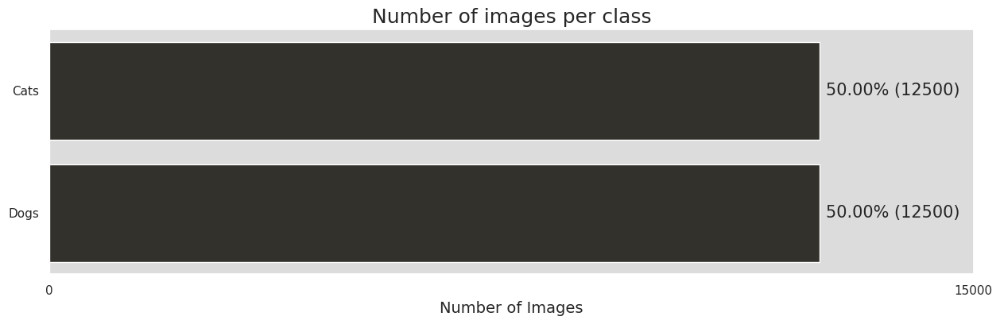

In [4]:
# Specify the path to the zip file
zip_path = '/kaggle/input/dogs-vs-cats/train.zip'

# Specify the directory where we want to extract the contents of the zip file
extract_path = '/kaggle/working/'

# Extract the zip file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)
    
# After extracting, specify the directory of the actual images
actual_extracted_path = os.path.join(extract_path, 'train')

# List all filenames in the actual extracted directory
filenames = os.listdir(actual_extracted_path)

# Separate filenames into cats and dogs
cat_images = [filename for filename in filenames if "cat" in filename]
dog_images = [filename for filename in filenames if "dog" in filename]

# Get the count of each class
cat_count = len(cat_images)
dog_count = len(dog_images)

# Calculate the percentages
total_images = cat_count + dog_count
cat_percentage = (cat_count / total_images) * 100
dog_percentage = (dog_count / total_images) * 100

# Plotting
labels = ['Cats', 'Dogs']
counts = [cat_count, dog_count]
percentages = [cat_percentage, dog_percentage]

# Set the figure size
plt.figure(figsize=(15, 4))

# Create a horizontal bar plot
ax = sns.barplot(y=labels, x=counts, orient='h', color='#33312b')

# Set x-axis interval
ax.set_xticks([0, 15000])

# Annotate each bar with the count and percentage
for i, p in enumerate(ax.patches):
    width = p.get_width()
    ax.text(width + 100, p.get_y() + p.get_height()/2., 
            '{:1.2f}% ({})'.format(percentages[i], counts[i]),
            va="center", fontsize=15)
    
# Set the x-label for the plot
plt.xlabel('Number of Images', fontsize=14)

# Set the title and show the plot
plt.title("Number of images per class", fontsize=18)
plt.show()

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
<h2 align="left"><font color='#33312b'>🔍 Inference on Image Class Distributions</font></h2>    

From the visual representation, we can observe that our dataset is perfectly balanced. Both cats and dogs have an equal number of images, specifically 12,500 each, constituting 50% of the dataset for each class. 

Having a balanced dataset means we don't need to worry about one class being overrepresented, which could lead to biases in our machine learning model. This sets a solid foundation for training our models!


<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
Next, I'll examine the dimensions of the images:

In [5]:
# Lists to store heights and widths of all images
heights = []
widths = []

# Initialize a set to store unique dimensions and channels
unique_dims = set()
unique_channels = set()

# Loop over filenames and check dimensions
for filename in filenames:
    img = cv2.imread(os.path.join(actual_extracted_path, filename))
    if img is not None:
        # Add the dimensions (height, width, channels) to the set
        unique_dims.add((img.shape[0], img.shape[1]))
        
        # Add the channels to the set
        unique_channels.add(img.shape[2])
        
        # Append heights and widths for statistical calculations
        heights.append(img.shape[0])
        widths.append(img.shape[1])

# Check if all images have the same dimension
if len(unique_dims) == 1:
    print(f"All images have the same dimensions: {list(unique_dims)[0]}")
else:
    print(f"There are {len(unique_dims)} different image dimensions in the dataset.")
    print(f"Min height: {min(heights)}, Max height: {max(heights)}, Mean height: {np.mean(heights):.2f}")
    print(f"Min width: {min(widths)}, Max width: {max(widths)}, Mean width: {np.mean(widths):.2f}")

# Check if all images have the same number of channels
if len(unique_channels) == 1:
    channel = list(unique_channels)[0]
    if channel == 3:
        print("All images are color images.")
    else:
        print("All images have the same number of channels, but they are not color images.")
else:
    print("Images have different numbers of channels.")

There are 8513 different image dimensions in the dataset.
Min height: 32, Max height: 768, Mean height: 360.48
Min width: 42, Max width: 1050, Mean width: 404.10
All images are color images.


<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
<h2 align="left"><font color='#33312b'>🔍 Inference on Image Dimensions</font></h2> 
    
From the dataset, we observed that there are a variety of image sizes, with heights ranging from 32 to 768 pixels and widths from 42 to 1050 pixels. The average dimensions are roughly (360, 404). Thankfully, all images are color images.

Given the diversity in image sizes, we'll need to consider resizing images to a fixed size later on. A common choice for many standard CNN architectures is (224, 224, 3). This will ensure consistency and compatibility with our chosen model.


<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
Let's dive into a visual exploration of images from both classes:

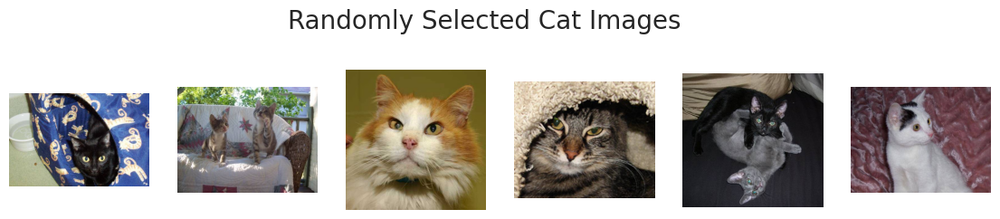

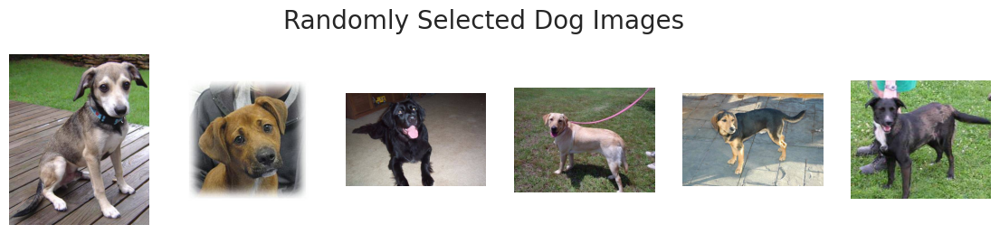

In [6]:
# Setting the random seed for reproducibility
np.random.seed(42)

# Randomly select 6 images from each category
random_cat_images = np.random.choice(cat_images, 6)
random_dog_images = np.random.choice(dog_images, 6)

# Function to plot images
def plot_images(images, title):
    plt.figure(figsize=(14, 3))
    for i, img_name in enumerate(images):
        plt.subplot(1, 6, i+1)
        img = cv2.imread(os.path.join(actual_extracted_path, img_name))
        # Convert the BGR image (default in OpenCV) to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img)
        plt.axis('off')
    plt.suptitle(title, fontsize=20)
    plt.show()

    
# Plot the images
plot_images(random_cat_images, "Randomly Selected Cat Images")
plot_images(random_dog_images, "Randomly Selected Dog Images")

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
<h2 align="left"><font color='#33312b'>🔍 Inference on Image Scale</font></h2> 
     
The dataset images __vary in scale__, with some capturing subjects closely and others at a more distant perspective.

In [7]:
# Deleting unnecessary variables to free up memory
del filenames, heights, widths, unique_dims, unique_channels

<a id="Preparation"></a>
# <p style="background-color: #33312b; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Step 3 | Dataset Preparation</p>
⬆️ [Tabel of Contents](#contents_tabel)

<a id="Centralize_Dataset"></a>
# <b><span style='color:gray'>Step 3.1 |</span><span style='color:#33312b'> Centralizing Dataset Information</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

In this step,I am going to centralize the dataset's information into a DataFrame. This makes it easier to manage and process the data in the subsequent steps:

In [8]:
# Initialize an empty list to store image file paths and their respective labels
data = []

# Append the cat image file paths with label "cat" to the data list
data.extend([(os.path.join(actual_extracted_path, filename), "cat") for filename in cat_images])

# Append the dog image file paths with label "dog" to the data list
data.extend([(os.path.join(actual_extracted_path, filename), "dog") for filename in dog_images])

# Convert the collected data into a DataFrame
df = pd.DataFrame(data, columns=['filepath', 'label'])

# Display the first few entries of the DataFrame
df.head()

,filepath,label
0,/kaggle/working/train/cat.2949.jpg,cat
1,/kaggle/working/train/cat.9533.jpg,cat
2,/kaggle/working/train/cat.5784.jpg,cat
3,/kaggle/working/train/cat.12343.jpg,cat
4,/kaggle/working/train/cat.5908.jpg,cat


In [9]:
# Deleting unnecessary variables to free up memory
del data, cat_images, dog_images

<a id="Data_Splitting"></a>
# <b><span style='color:gray'>Step 3.2 |</span><span style='color:#33312b'> Data Splitting into Training & Validation Sets</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

Then, I am going to split our dataset into train and validation sets, ensuring a balanced class distribution with stratification and mixing the images for randomness using shuffling:

In [10]:
# Split the data into training and validation sets
train_df, val_df = train_test_split(df, test_size=0.2, stratify=df['label'], random_state=42)

# Display the shape of the training and validation sets
print("Training data shape:", train_df.shape)
print("Validation data shape:", val_df.shape)

# Deleting the original DataFrame to free up memory
del df

Training data shape: (20000, 2)
Validation data shape: (5000, 2)


In [11]:
# Display the first few rows of the train DataFrame
train_df.head()

,filepath,label
20022,/kaggle/working/train/dog.9492.jpg,dog
4993,/kaggle/working/train/cat.1923.jpg,cat
24760,/kaggle/working/train/dog.3587.jpg,dog
13775,/kaggle/working/train/dog.2591.jpg,dog
20504,/kaggle/working/train/dog.11708.jpg,dog


<a id="Weather_Simulation"></a>
# <b><span style='color:gray'>Step 3.3 |</span><span style='color:#33312b'> Weather Simulation</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
Our goal is to build a weather-proof model, and as observed, our dataset images are all under normal conditions. To address this, I will define three separate functions to introduce __rain__, __snow__, and __fog__ effects to the images. The `albumentations` library will be instrumental in achieving this:

<a id="rain"></a>
## <b><span style='color:gray'>Step 3.3.1 |</span><span style='color:#33312b'> Rain Effect Integration</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

In this part, I am going to use `RandomRain` method of `albumentations` library to define a function for adding rain effect to the input image. The definition of this method's arguments are as follows:

- **slant_lower and slant_upper**: These determine the angle range at which the rain falls. For instance, a value of `-10` and `10` means rain can slant between -10 to 10 degrees.
 
    
- **drop_length**: The length of individual raindrops. A higher value results in longer raindrops.
  
    
- **drop_width**: The width of individual raindrops. A higher value makes thicker raindrops.
  
    
- **drop_color**: Color of the raindrops, given in RGB format. For example, `(200, 200, 200)` represents a light gray color.
  
    
- **blur_value**: How blurry the rain appears. Lower values mean sharper raindrops, while higher values give a foggy appearance to the rain.
  
    
- **brightness_coefficient**: Controls the brightness of the image after adding the rain. A value less than 1 darkens the image, and greater than 1 brightens it.
  
    
- **rain_type**: Can be set to `'drizzle'`, `'light'`, `'heavy'`, or `None`. This sets the pre-defined styles of rain. If set to `None`, the method uses the provided arguments to generate the rain effect.
    
    
- **p**: The probability of applying the rain augmentation to an image. A value of `1` ensures that the rain effect is always applied.

    
Remember, adjusting these parameters carefully can help in achieving the desired rain effect in the image.

In [12]:
def add_rain(image, 
             slant_lower=-10,            # Lower bound for rain slant
             slant_upper=10,             # Upper bound for rain slant
             drop_length=20,             # Length of the raindrops
             drop_width=1,               # Width of the raindrops
             drop_color=(200, 200, 200), # Color of the raindrops
             blur_value=3,               # Amount of blur added due to rain
             brightness_coefficient=0.9, # Adjust brightness of image  
             rain_type=None):            # Type of rain (drizzle or None for regular)
    
    """Add rain effect to the input image using specified parameters."""
    
    # Create the rain augmentation using albumentations
    rain_aug = albumentations.RandomRain(
                                         slant_lower=slant_lower,  
                                         slant_upper=slant_upper,  
                                         drop_length=drop_length,  
                                         drop_width=drop_width,  
                                         drop_color=drop_color,  
                                         blur_value=blur_value,  
                                         brightness_coefficient=brightness_coefficient,  
                                         rain_type=rain_type,  
                                         p=1  # Probability of augmentation. Set to 1 for always applying
    )
    
    # Apply the rain augmentation to the image
    augmented = rain_aug(image=image)

    return augmented['image']    

<a id="snow"></a>
## <b><span style='color:gray'>Step 3.3.2 |</span><span style='color:#33312b'> Snow Effect Integration</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

In this part, I utilize the `RandomSnow` method from the `albumentations` library to define a function for adding a snow effect to the input image. The definitions of this method's arguments are as follows:

- **snow_point_lower and snow_point_upper**: These determine the intensity range of the snow effect. For example, values of `0.1` and `0.3` mean that the snow can cover between `10%` to `30%` of the image.
  
    
- **brightness_coeff**: Controls the brightness of the image after adding the snow. A value greater than `1` will brighten the image, reflecting the nature of snowy landscapes which often appear brighter.
    

- **p**: The probability of applying the snow augmentation to an image. A value of `1` ensures that the snow effect is always applied.
  
**Note**: Just like the rain effect, adjusting these parameters can lead to varying intensities and appearances of snow in the image, making it crucial to fine-tune them based on the desired outcome.


In [13]:
def add_snow(image, 
             snow_point_lower=0.1,          # Minimum intensity of snow 
             snow_point_upper=0.2,          # Maximum intensity of snow 
             brightness_coeff=2.0):         # Brightness coefficient for the image post snow effect
    
    """Add snow effect to the input image using specified parameters."""
    
    # Define the snow augmentation from albumentations with provided parameters
    snow_aug = albumentations.RandomSnow(snow_point_lower=snow_point_lower, 
                                         snow_point_upper=snow_point_upper, 
                                         brightness_coeff=brightness_coeff, 
                                         p=1  # Probability of augmentation. Set to 1 for always applying
                                         )
    
    # Apply the snow augmentation to the image
    augmented = snow_aug(image=image)
    
    return augmented['image']

<a id="fog"></a>
## <b><span style='color:gray'>Step 3.3.3 |</span><span style='color:#33312b'> Fog Effect Integration</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

In this part, I am going to use the `RandomFog` method of the `albumentations` library to define a function for adding a fog effect to the input image. The definition of this method's arguments are as follows:

- **fog_coef_lower**: Represents the minimum intensity of fog. For example, a value of `0.3` means that at least `30%` of the image will have a fog effect.
 

- **fog_coef_upper**: Represents the maximum intensity of fog. A value of `1` would mean that up to `100%` of the image can be covered in fog.
  

- **alpha_coef**: Defines the transparency of the fog with a range between `0` and `1`. A value closer to `0` makes the fog more transparent, while a value closer to `1` makes it denser and more opaque.
  
    
- **p**: The probability of applying the fog augmentation to an image. A value of `1` ensures that the fog effect is always applied.

    
By using these parameters, we can simulate different foggy conditions on our images, enhancing the model's robustness against such weather conditions.

In [14]:
def add_fog(image, 
            fog_coef_lower=0.3,           # Minimum intensity of fog
            fog_coef_upper=1,             # Maximum intensity of fog
            alpha_coef=0.08):             # Transparency of the fog
    
    """Add fog effect to the input image using specified parameters."""
    
    # Create the fog augmentation using albumentations
    fog_aug = albumentations.RandomFog(fog_coef_lower=fog_coef_lower, 
                                       fog_coef_upper=fog_coef_upper, 
                                       alpha_coef=alpha_coef, 
                                       p=1  # Probability of augmentation. Set to 1 for always applying
                                       )
    
    # Apply the fog augmentation to the image
    augmented = fog_aug(image=image)
    
    return augmented['image']

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

Having defined the three augmentations above, let's visualize their impact on 6 randomly selected images from the training dataset:

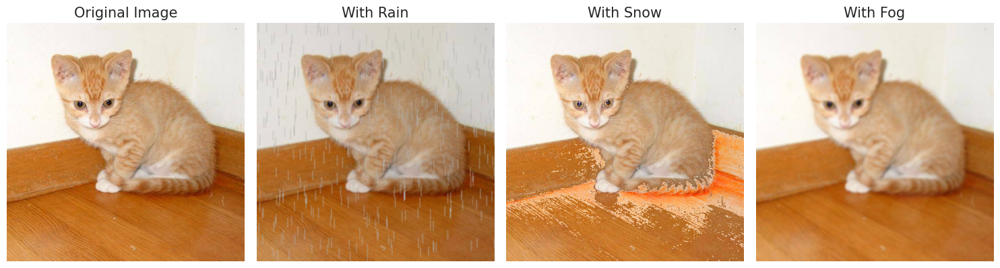

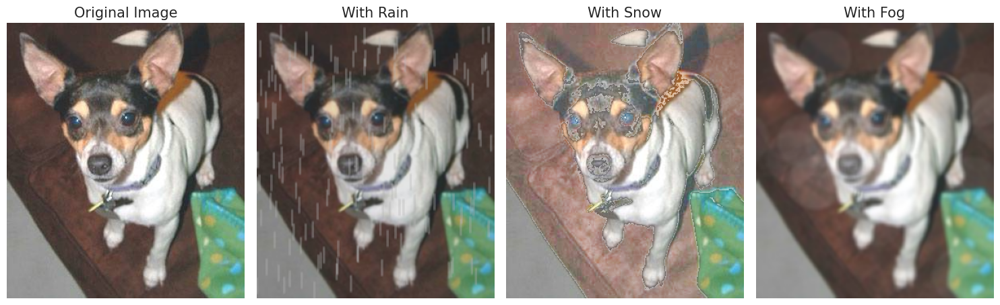

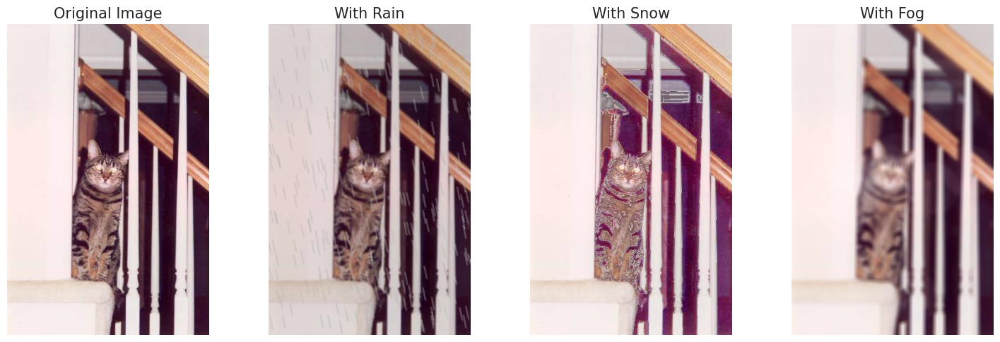

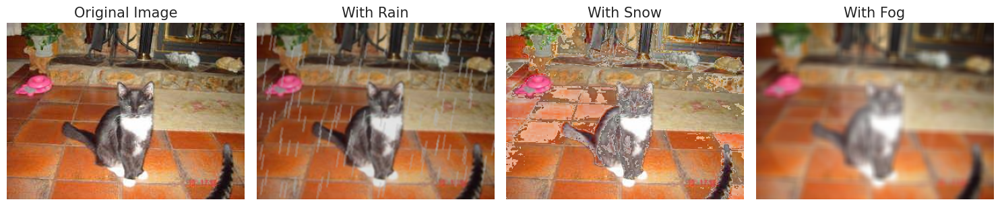

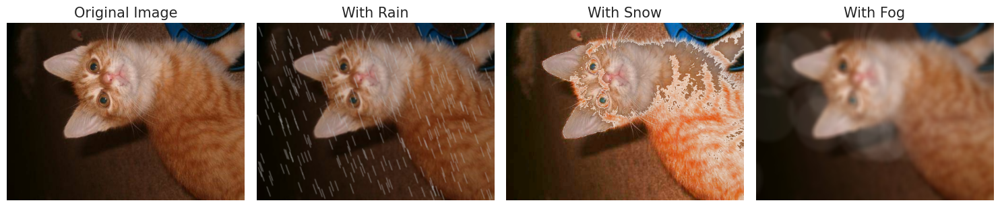

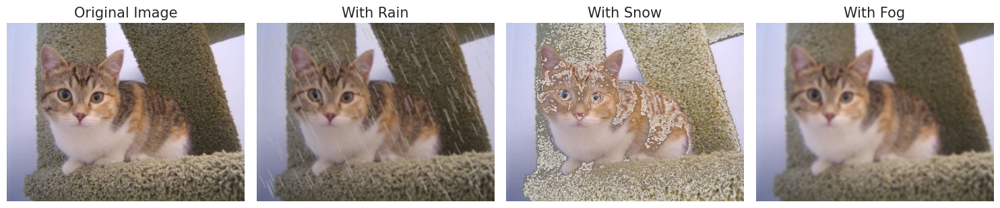

In [15]:
# Setting the random seed for reproducibility
np.random.seed(42)

# Select 6 random images from the train_df
random_image_paths = random.sample(train_df['filepath'].tolist(), 6)

# For each image, display original and the ones with effects
for image_path in random_image_paths:
    # Read the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Apply augmentations
    image_rain = add_rain(image)
    image_snow = add_snow(image)
    image_fog = add_fog(image)
    
    # Display images
    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    
    axes[0].imshow(image)
    axes[0].set_title("Original Image", fontsize=15)
    axes[0].axis("off")
    
    axes[1].imshow(image_rain)
    axes[1].set_title("With Rain", fontsize=15)
    axes[1].axis("off")
    
    axes[2].imshow(image_snow)
    axes[2].set_title("With Snow", fontsize=15)
    axes[2].axis("off")
    
    axes[3].imshow(image_fog)
    axes[3].set_title("With Fog", fontsize=15)
    axes[3].axis("off")
    
    plt.tight_layout()
    plt.show()

<a id="random_effect"></a>
## <b><span style='color:gray'>Step 3.3.4 |</span><span style='color:#33312b'> Applying Random Weather Effects to Dataset</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
<h2 align="left"><font color='#33312b'>🌦️ Random Weather Effect Explanation</font></h2> 

I am going to define the `random_weather_effect` function which is designed to apply a random weather effect to a given image. It selects among the three weather effects we've defined earlier - snow, rain, and fog. Additionally, there's a chance it might decide not to apply any effect at all. So, every time an image is processed through this function, it could receive a touch of rain, a sprinkle of snow, a mist of fog, or remain completely unchanged:

In [16]:
def random_weather_effect(img):
    """
    Apply a random weather effect (rain, snow, fog) or no effect to an image.
    
    Parameters:
    - img: Input image to be augmented.

    Returns:
    - Augmented image with a random weather effect or the original image.
    """
    
    # List of possible weather effects including no effect (lambda x: x)
    effects = [add_snow, add_rain, add_fog, lambda x: x]
    
    # Randomly choose one effect from the list
    effect = random.choice(effects)
    
    # Apply the chosen effect and return the result
    return effect(img)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

In order to make my model more robust to different environmental conditions, I am going to apply the above function to all images in the `train_df` DataFrame and overwrite the original images with the augmented ones:

In [17]:
def apply_effects_and_save(image_path):
    """
    Apply a random weather effect to an image at a given path and overwrite the original image.

    This function reads an image from a specified file path using OpenCV, applies one of several
    weather effects (snow, rain, fog, or none), and saves the altered image back to the same path,
    effectively overwriting the original image.

    Parameters:
    - image_path (str): The file path to the image that will be augmented with a weather effect.

    Raises:
    - ValueError: If the image at the given path cannot be opened or processed.
    """
    
    # Read the image file using OpenCV
    img = cv2.imread(image_path)
    
    # Check if the image was correctly opened
    if img is None:
        raise ValueError(f"Image at path {image_path} could not be opened.")
    
    # Convert from BGR to RGB since OpenCV uses BGR by default
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Apply random weather effect
    augmented_img = random_weather_effect(img)
    
    # Convert back from RGB to BGR before saving with OpenCV
    augmented_img = cv2.cvtColor(augmented_img, cv2.COLOR_RGB2BGR)
    
    # Save the augmented image back to the original path
    cv2.imwrite(image_path, augmented_img)

In [18]:
# Iterate over the images in the train set DataFrame
for index, row in train_df.iterrows():
    image_path = row['filepath']
    # Check if the image file exists
    if os.path.exists(image_path):
        try:
            apply_effects_and_save(image_path)
        except ValueError as e:
            print(e)
    else:
        print(f"Image not found at path: {image_path}")

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

Let's display a selection of images randomely from the training set to verify the correct application of weather effects:

In [19]:
def display_random_images(image_paths, labels, num_images=16):
    """
    Display a random set of images in a grid.
    
    Parameters:
    - image_paths (list): List of filepaths to images.
    - labels (list): Corresponding labels for the images.
    - num_images (int): Total number of images to display.
    """
    # Select a random subset of image paths and their labels
    random_indices = np.random.choice(len(image_paths), num_images, replace=False)
    selected_image_paths = [image_paths[i] for i in random_indices]
    selected_labels = [labels[i] for i in random_indices]
    
    # Calculate number of rows and columns for the subplot grid
    num_rows = num_images // 4
    num_cols = 4
    
    # Create the subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
    axes = axes.ravel()
    
    # Read and display each image
    for i, (path, label, ax) in enumerate(zip(selected_image_paths, selected_labels, axes)):
        # Read the image using OpenCV
        img = cv2.imread(path)
        # Convert BGR image to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax.imshow(img)
        ax.set_title(label, fontsize=15)
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

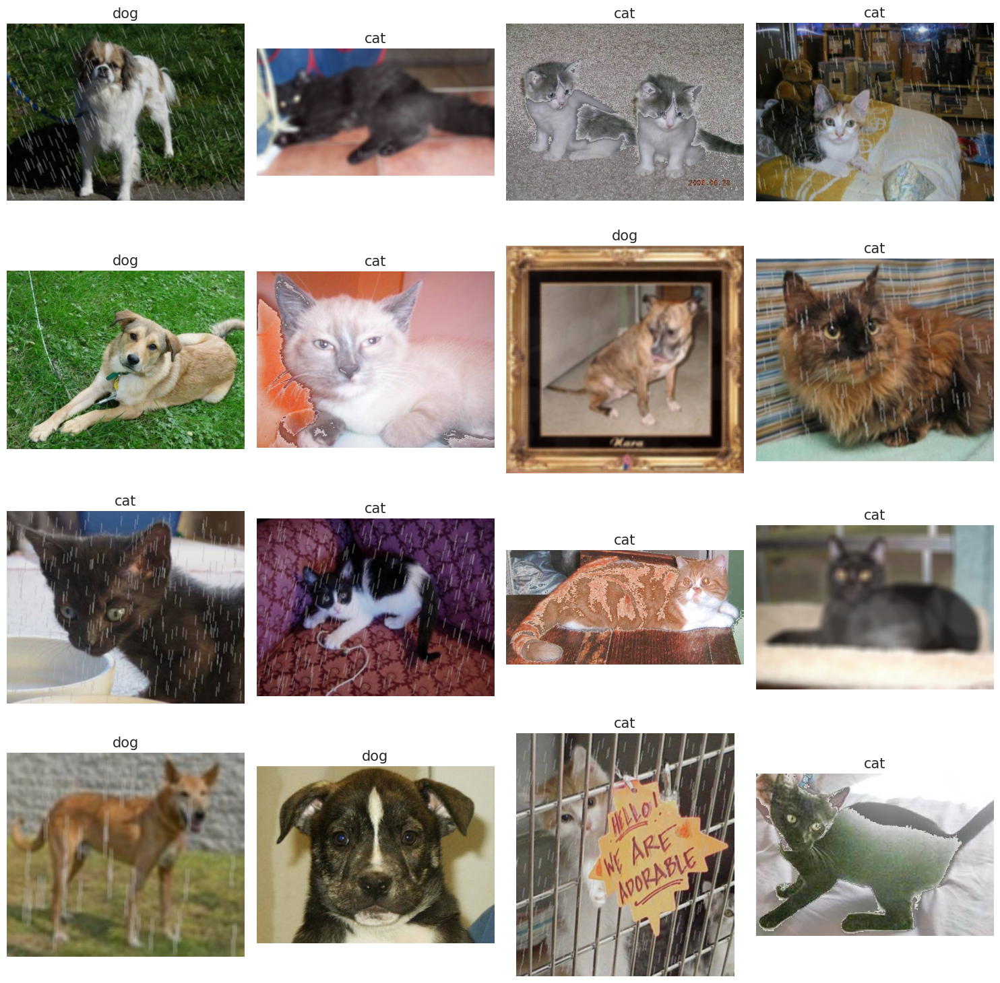

In [20]:
# Display the images
display_random_images(train_df['filepath'].tolist(), train_df['label'].tolist())

In [21]:
# Print the length of the training set
print(f"Length of Training Set: {len(train_df['filepath'].tolist())}")

Length of Training Set: 20000


<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

The displayed images confirm that weather effects have been successfully and randomly implemented across the training set.

<a id="Augmentation"></a>
# <b><span style='color:gray'>Step 3.4 |</span><span style='color:#33312b'> Data Augmentation & Preprocessing</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
### <span style="color:'#33312b'">🔍 Concerns:</span>
    
1️⃣ To ensure our model works well in various situations, we want to change our images in different ways, such as rotating or shifting them. This also helps in preventing overfitting when fine-tuning our predefined models.
    
2️⃣ With a large dataset of 20,000 images, storing all augmented versions in memory isn't feasible. So, we should apply these changes in real-time, or "__on-the-fly__", as we train.
    
3️⃣ Each pre-trained model we plan to use has its unique way of processing images. To get the best results, we need to ensure we're preparing our images in the right way for each model.


<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
### <span style="color:'#33312b'">🛠️ Strategy:</span>

- Keras offers a powerful utility called __`ImageDataGenerator`__, which enables real-time image augmentation during training. This approach is both memory-efficient, as it eliminates the need to store the augmented images, and dynamic, allowing us to introduce a variety of transformations such as rotation and shifts to enhance model generalization.

    
- By leveraging the __`flow_from_dataframe`__ method, we can directly link our image transformations to our DataFrame source. This ensures a seamless integration of __on-the-fly__ augmentation with our training process.

    
- To cater to the distinct preprocessing protocols of different pre-trained models, we'll encapsulate our augmentation logic within a function. This function will intelligently apply the specific preprocessing steps (`preprocessing_function`) needed for each model, ensuring optimal compatibility and performance during fine-tuning.


In [22]:
def create_data_generators(preprocessing_function=None, batch_size=32, image_dimensions=(224, 224)):
    """
    Creates and returns training and validation data generators with optional weather effects and preprocessing.
    
    Parameters:
    - preprocessing_function (function, optional): Preprocessing function specific to a model. Defaults to None.
    - batch_size (int, optional): Number of images per batch for the generators. Defaults to 32.
    - image_dimensions (tuple, optional): Dimensions to which the images will be resized (height, width). Defaults to (224, 224).
    
    Returns:
    - train_generator (ImageDataGenerator): Generator for training data with augmentations.
    - val_generator (ImageDataGenerator): Generator for validation data without augmentations.
    
    Notes:
    - The training generator uses augmentations.
    - The validation generator does not use any augmentations.
    - If provided, the preprocessing function is applied to both generators.
    """

    # Define our training data generator with specific augmentations
    train_datagen = ImageDataGenerator(
        rotation_range=15,                             # Randomly rotate the images by up to 15 degrees
        width_shift_range=0.15,                        # Randomly shift images horizontally by up to 15% of the width
        height_shift_range=0.15,                       # Randomly shift images vertically by up to 15% of the height
        zoom_range=0.15,                               # Randomly zoom in or out by up to 15%
        horizontal_flip=True,                          # Randomly flip images horizontally
        vertical_flip=False,                           # Do not flip images vertically as it doesn't make sense in our context
        shear_range=0.02,                              # Apply slight shear transformations
        preprocessing_function=preprocessing_function  # Apply preprocessing function if provided
    )

    # Define our validation data generator without any augmentations but with the preprocessing function if provided
    val_datagen = ImageDataGenerator(
        preprocessing_function=preprocessing_function  # Apply preprocessing function if provided
    )

    # Create an iterable generator for training data
    train_generator = train_datagen.flow_from_dataframe(
        dataframe=train_df,                 # DataFrame containing training data
        x_col="filepath",                   # Column with paths to image files
        y_col="label",                      # Column with image labels
        target_size=image_dimensions,       # Resize all images to size of 224x224 
        batch_size=batch_size,              # Number of images per batch
        class_mode='binary',                # Specify binary classification task
        seed=42,                            # Seed for random number generator to ensure reproducibility
        shuffle=True                        # Shuffle the data to ensure the model gets a randomized batch during training
    )

    # Create an iterable generator for validation data
    val_generator = val_datagen.flow_from_dataframe(
        dataframe=val_df,                   # DataFrame containing validation data
        x_col="filepath",                       
        y_col="label",
        target_size=image_dimensions,
        batch_size=batch_size,
        class_mode='binary',
        seed=42,
        shuffle=False                       # Shuffling not necessary for validation data
    )
    
    # Return the training and validation generators
    return train_generator, val_generator

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
### <span style="color:'#33312b'"> 📝 Note on Validation Data Augmentation:</span>

I applied neither the weather effects nor the data augmentation techniques on the validation images. The reason for this is twofold:
    
1️⃣ **Validation Set Should Reflect Real-World Conditions**: The purpose of the validation set is to evaluate how well the model might perform on unseen real-world data. By applying augmentation techniques, especially artificial ones, we risk __distorting__ this real-world representation. We want to ensure that the model's performance metrics on the validation set are as realistic as possible.
    
    
2️⃣ **Measure the Impact of Augmentation**: By keeping the validation set free from such augmentations, we can measure how effective our training-time augmentations (like the weather effects) are. If the model performs well on the __unaugmented__ validation set, it indicates that the augmentations during training have improved the model's generalization capabilities.

<a id="Model_Architecture"></a>
# <p style="background-color: #33312b; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Step 4 | Model Architecture Development</p>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
<h2 align="left"><font color='#33312b'>🏗️ Leveraging Transfer Learning for Robust Performance</font></h2> 
    
In our project, we're tackling a classic binary image classification problem: distinguishing between **cats** and **dogs**. The **ImageNet** dataset, known for its extensive variety of images including numerous cat and dog breeds, serves as the foundational training ground for many state-of-the-art **pre-trained** neural networks. These networks have developed robust feature maps for cats and dogs, which we can leverage for our specific task through **transfer learning**.

Transfer learning allows us to take a pre-trained model and repurpose it for our **cat/dog classification** by utilizing its powerful feature-extracting capabilities. To adapt the model to our needs, we remove its original classification head – the part trained to identify 1,000 different ImageNet classes – and replace it with a new classifier tailored to our **binary** task.

During this process, we **freeze** the feature-extraction layers of the pre-trained network. This means we keep the weights, which have been fine-tuned through extensive ImageNet training, intact. **We only train the newly added classifier from scratch.** This approach effectively turns the pre-trained model into a feature extractor for our dataset, allowing us to utilize the complex feature maps already learned without having to train these layers all over again. By focusing on training just the classifier, we efficiently re-target the model's learned patterns to discern between cats and dogs in our images.

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

By employing transfer learning with a pre-trained model for our cat/dog classification, we enjoy several advantages:

1️⃣ **Efficiency in Training**: We drastically reduce the training time since the complex feature maps have already been learned.
    
2️⃣ **Lower Data Requirement**: There's less need for a large labeled dataset, as the pre-trained layers already understand general features.
    
3️⃣ **Improved Performance**: The pre-trained network brings a level of sophistication and learning that is challenging to achieve from scratch, especially with limited data.
    
4️⃣ **Resource Optimization**: It allows for the use of less computational power, making it a cost-effective solution.


<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
<h2 align="left"><font color='#33312b'>💡 Model Selection Criteria for Real-Time Analysis</font></h2>

When selecting the optimal models for real-time CCTV footage analysis for a desktop application, we aim for a sweet spot between accuracy and computational efficiency. Our choices are informed by [Keras pre-trained models benchmark](https://keras.io/api/applications/):

### 1️⃣ ResNet50V2: A Balance of Depth and Efficiency
- **Efficiency**: At 98 MB, ResNet50V2 is relatively compact, suitable for desktop deployments.
- **Accuracy**: Offers a Top-1 accuracy of 76.0%, providing a solid performance for our needs.
- **Speed**: Reasonable inference time on CPU and GPU, crucial for real-time applications.

### 2️⃣ InceptionV3: Mastering Multi-Scale Patterns
- **Multi-Scale Patterns**: Its design is adept at managing images with varying complexities, crucial for our diverse dataset.
- **Trade-off**: A well-measured balance between model size (92 MB), computational demand, and accuracy (Top-1 accuracy of 77.9%).

### 3️⃣ MobileNetV2: The Speed Demon
- **Lightweight**: Exceptionally small at 14 MB, it's perfect for resource-limited desktop applications.
- **Speed**: Boasts fast inference times, essential for immediate processing.
- **Accuracy vs. Size**: While the accuracy (71.3% Top-1) is marginally lower, the efficiency and speed benefits are particularly valuable for our use case.

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

Considering the strengths of each model, our goal is to find a balance between accuracy, processing speed, and ease of deployment for our real-time analysis project. The final selection will be the model that excels in both accuracy and speed, aligning with the requirements of our desktop application.

<a id="ResNet50V2_Architecture"></a>
# <b><span style='color:gray'>Step 4.1 |</span><span style='color:#33312b'> ResNet50V2 Architecture</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

Firstly, I am going to initialize the ResNet50V2 model with ImageNet weights, omitting the top classification layer. Additionally, we'll set our input image dimensions to `(224,224,3)`, which is the standard input size that this pre-trained model expects:


In [23]:
# Load the ResNet50V2 model pre-trained on ImageNet data, excluding the top classifier
resnet50v2_base = ResNet50V2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
resnet50v2_base.summary()

94668760/94668760 [==============================] - 1s 0us/step
Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                        

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
The feature extractor portion of the **ResNet50V2** model comprises approximately **23.5 million** trainable parameters, all of which will be frozen:

In [24]:
# Freezes all layers in the ResNet50V2 base model
resnet50v2_base.trainable = False

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

Then, I am going to add a custom fully connected neural network on top of the pre-trained **ResNet50V2** base model to serve as a binary classifier for our task:

In [25]:
x = resnet50v2_base.output
# Add a global spatial average pooling layer to reduce the dimensions of the feature maps
x = GlobalAveragePooling2D()(x)
# Add a fully-connected layer to learn more complex representations specific to our task
x = Dense(1024, activation='relu')(x)  
# Add a dropout layer for regularization
x = Dropout(0.5)(x) 
# Add a logistic layer for binary classification
predictions = Dense(1, activation='sigmoid')(x)  

# This is the model we will train
resnet50v2_model = Model(inputs=resnet50v2_base.input, outputs=predictions)

# Compile the model after setting layers to non-trainable
resnet50v2_model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
Now, let's visualize the architecture of our final ResNet50V2 model:

In [26]:
plot_model(resnet50v2_model, show_shapes=True, show_layer_names=False, dpi=150)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
We can also examine our final **ResNet50V2** model summary to understand the number of parameters involved:

In [27]:
# Model summary
resnet50v2_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
### <span style="color:'#33312b'"> 📉 Trainable Parameter Reduction in ResNet50V2</span>

By freezing the feature extraction layers of the ResNet50V2 model, we have significantly decreased the trainable parameters to around **2 million** from the original **23.5 million**. This reduction strikes a balance, mitigating overfitting and leveraging the model's pre-trained intelligence.


<a id="InceptionV3_Architecture"></a>
# <b><span style='color:gray'>Step 4.2 |</span><span style='color:#33312b'> InceptionV3 Architecture</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
Same as the previous step, I am going to initialize the **InceptionV3** base model with weights pre-trained on ImageNet, keeping the architecture's default input size of `(299, 299, 3)`. The layers of the base model are frozen to maintain the learned features, and a custom classifier is appended for the binary classification task:

In [28]:
# Load the InceptionV3 model pre-trained on ImageNet data, excluding the top classifier
inceptionv3_base = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))
inceptionv3_base.summary()

# Freezes all layers in the InceptionV3 base model
inceptionv3_base.trainable = False

# Following the same pattern to add new layers
x = inceptionv3_base.output
x = GlobalAveragePooling2D()(x) 
x = Dense(1024, activation='relu')(x)  
x = Dropout(0.5)(x)  
predictions = Dense(1, activation='sigmoid')(x)

# This is the model we will train
inceptionv3_model = Model(inputs=inceptionv3_base.input, outputs=predictions)

# Compile the model after setting layers to non-trainable
inceptionv3_model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# InceptionV3 model summary
inceptionv3_model.summary()

87910968/87910968 [==============================] - 0s 0us/step
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 149, 149, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 149, 149, 32  96         ['conv2d[0][0]']                 
 alization)           

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

As anticipated, we observe that **InceptionV3** has a similar count of **2 million** trainable parameters to ResNet50V2, attributed to the identical classifiers and the completely frozen feature extractor layers in both models. Let's take a look at the architecture of our final **InceptionV3** model:

In [29]:
plot_model(inceptionv3_model, show_shapes=True, show_layer_names=False, dpi=150)

<a id="MobileNetV2_Architecture"></a>
# <b><span style='color:gray'>Step 4.3 |</span><span style='color:#33312b'> MobileNetV2 Architecture</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

In this step, my aim is to harness the **MobileNetV2** architecture and explore two distinct classifier strategies:
    
- Employing a Neural Network Classifier in conjunction with MobileNetV2
- Integrating a Support Vector Machine (SVM) Classifier with MobileNetV2


<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
At this stage, I will adopt a consistent method for the feature extraction part of **MobileNetV2** as we did with ResNet50V2, utilizing an input shape of **(224, 224, 3)**. The **MobileNetV2** model is initialized with ImageNet pre-trained weights, and the `include_top=False` parameter is set to remove the original classification layers. This prepares the model for the addition of a custom classifier tailored to our binary classification task:


In [30]:
# Load the MobileNetV2 model pre-trained on ImageNet data, excluding the top classifier
mobilenetv2_base = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
mobilenetv2_base.summary()

9406464/9406464 [==============================] - 0s 0us/step
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

The **MobileNetV2** feature extractor comprises approximately **2.2 million** parameters, indicative of a lightweight model, which we will freeze to leverage its pre-trained weights:

In [31]:
# Freeze all layers in the MobileNetV2 base model
mobilenetv2_base.trainable = False

<a id="NN_Classifier"></a>
## <b><span style='color:gray'>Step 4.3.1 |</span><span style='color:#33312b'> MobileNetV2 with Neural Network Classifier</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

For the first approach, I am going to implement a fully connected neural network as a classifier following the pattern used for **InceptionV3** and **ResNet50V2**:

In [32]:
# Following the same pattern to add new layers to MobileNetV2 base
x = mobilenetv2_base.output
x = GlobalAveragePooling2D()(x) 
x = Dense(128, activation='relu')(x)  # Reduced number of neurons!
x = Dropout(0.5)(x)  
predictions = Dense(1, activation='sigmoid')(x)

# This is the model we will train
mobilenetv2_nn_model = Model(inputs=mobilenetv2_base.input, outputs=predictions)

# Compile the model after setting layers to non-trainable
mobilenetv2_nn_model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# MobileNetV2 model summary
mobilenetv2_nn_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

The tailored **MobileNetV2** architecture comprises approximately **164,000** trainable parameters, a reduction achieved by opting for a denser layer with fewer neurons in the classifier (**128 neurons**).

<a id="SVM_Classifier"></a>
## <b><span style='color:gray'>Step 4.3.2 |</span><span style='color:#33312b'> MobileNetV2 with SVM Classifier</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

In this approach, I plan to employ a **Support Vector Machine (SVM)** as the classifier, stepping away from the neural network-based methods. The rationale is that an SVM may offer superior performance for our specific dataset, following feature extraction via a CNN. This potential improvement can be attributed to the SVM's effectiveness at determining an optimal decision boundary within the feature space created by the CNN.
    
This technique is often referred to as "**feature extraction**" where the deep learning model is used as a means to convert raw image data into a rich, more abstract representation that captures the essential aspects of the visual content. These representations, or feature vectors, can then be used as inputs to traditional classifiers. To construct our feature extractor for this method, we will be reemploying the `mobilenetv2_base`, which is the MobileNetV2 architecture pretrained on the ImageNet dataset:

In [33]:
# Add a GlobalAveragePooling layer to reduce the feature maps to a single vector per map
gap = GlobalAveragePooling2D()(mobilenetv2_base.output)

# Construct the feature extractor model
mobilenetv2_feature_extractor = Model(inputs=mobilenetv2_base.input, outputs=gap)

In [34]:
# Investigate the output shape of feature extractor
output_shape = mobilenetv2_feature_extractor.output_shape
print("Output shape of feature extractor model:", output_shape)

Output shape of feature extractor model: (None, 1280)


<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

The **`mobilenetv2_feature_extractor`** transforms each input image into a feature vector with **1280** elements. The `None` in the output shape represents the batch size, which is flexible and depends on the number of images processed in a single batch.

<a id="Classifier_Training"></a>
# <p style="background-color: #33312b; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Step 5 | Classifier Training</p>
⬆️ [Tabel of Contents](#contents_tabel)

<a id="ResNet50V2_Classifier"></a>
# <b><span style='color:gray'>Step 5.1 |</span><span style='color:#33312b'> Training the ResNet50V2 Classifier</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
I am going to define a versatile function to train various models, leveraging the consistency in our training process and data handling, allowing us to efficiently swap different architectures with minimal code changes:

In [35]:
def train_model(model, preprocessing_function, image_dimensions=(224, 224), batch_size=32, num_epochs=20):
    """
    Trains the given model and returns the trained model, its history, and the validation generator.
    
    Parameters:
    - model: Model, a compiled instance of a Keras model to be trained.
    - preprocessing_function: function, preprocessing function to be applied to input data.
    - image_dimensions: tuple, dimensions of the images (width, height).
    - batch_size: int, number of samples per batch of computation.
    - num_epochs: int, number of epochs to train the model.
    
    Returns:
    - model: The trained model instance.
    - history: A History object containing the training history.
    - val_generator: The validation data generator.
    """

    # Create data generators
    train_generator, val_generator = create_data_generators(preprocessing_function, batch_size, image_dimensions)

    # Define the callbacks
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=0.00001)
    early_stopping = EarlyStopping(monitor='val_loss', mode='min', patience=10, restore_best_weights=True, verbose=1)

    # Train the model
    history = model.fit(
        train_generator,
        steps_per_epoch=len(train_generator),
        epochs=num_epochs,
        validation_data=val_generator,
        validation_steps=len(val_generator),
        callbacks=[reduce_lr, early_stopping]
    )
    
    return model, history, val_generator

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
Now, let's call the above function to train our **ResNet50V2** model classifier:

In [36]:
# Train the ResNet50V2 model classifier
resnet50v2_model, resnet50v2_history, resnet50v2_val_generator = train_model(
    resnet50v2_model,
    preprocessing_function=resnet_preprocess_input,  # The preprocessing function for ResNet50V2
    image_dimensions=(224, 224),                     # Adjusting to the expected input size for ResNet50V2
    batch_size=32,
    num_epochs=20
)

Found 20000 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.
Epoch 1/20
625/625 [==============================] - 250s 384ms/step - loss: 0.1224 - accuracy: 0.9499 - val_loss: 0.0311 - val_accuracy: 0.9890 - lr: 1.0000e-04
Epoch 2/20
625/625 [==============================] - 240s 384ms/step - loss: 0.0951 - accuracy: 0.9607 - val_loss: 0.0297 - val_accuracy: 0.9884 - lr: 1.0000e-04
Epoch 3/20
625/625 [==============================] - 236s 378ms/step - loss: 0.0842 - accuracy: 0.9653 - val_loss: 0.0298 - val_accuracy: 0.9900 - lr: 1.0000e-04
Epoch 4/20
625/625 [==============================] - 236s 378ms/step - loss: 0.0808 - accuracy: 0.9664 - val_loss: 0.0266 - val_accuracy: 0.9912 - lr: 1.0000e-04
Epoch 5/20
625/625 [==============================] - 234s 375ms/step - loss: 0.0726 - accuracy: 0.9714 - val_loss: 0.0285 - val_accuracy: 0.9898 - lr: 1.0000e-04
Epoch 6/20
625/625 [==============================] - 234s 374

<a id="InceptionV3_Classifier"></a>
# <b><span style='color:gray'>Step 5.2 |</span><span style='color:#33312b'> Training the InceptionV3 Classifier</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
Next, I'll utilize the previously defined function to train our **InceptionV3** model classifier:

In [37]:
# Train the InceptionV3 model classifier
inceptionv3_model, inceptionv3_history, inceptionv3_val_generator = train_model(
    inceptionv3_model, 
    preprocessing_function=inceptionv3_preprocess_input,  # The preprocessing function for InceptionV3
    image_dimensions=(299, 299),                          # Adjusting to the expected input size for InceptionV3
    batch_size=32,
    num_epochs=20
)

Found 20000 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.
Epoch 1/20
625/625 [==============================] - 417s 657ms/step - loss: 0.1064 - accuracy: 0.9606 - val_loss: 0.0217 - val_accuracy: 0.9946 - lr: 1.0000e-04
Epoch 2/20
625/625 [==============================] - 402s 643ms/step - loss: 0.0781 - accuracy: 0.9694 - val_loss: 0.0200 - val_accuracy: 0.9940 - lr: 1.0000e-04
Epoch 3/20
625/625 [==============================] - 396s 634ms/step - loss: 0.0716 - accuracy: 0.9722 - val_loss: 0.0201 - val_accuracy: 0.9940 - lr: 1.0000e-04
Epoch 4/20
625/625 [==============================] - 404s 647ms/step - loss: 0.0700 - accuracy: 0.9724 - val_loss: 0.0182 - val_accuracy: 0.9938 - lr: 1.0000e-04
Epoch 5/20
625/625 [==============================] - 399s 638ms/step - loss: 0.0670 - accuracy: 0.9737 - val_loss: 0.0194 - val_accuracy: 0.9940 - lr: 1.0000e-04
Epoch 6/20
625/625 [==============================] - 414s 663

<a id="MobileNetV2_NN_Classifier"></a>
# <b><span style='color:gray'>Step 5.3 |</span><span style='color:#33312b'> Training the Neural Network Classifier for MobileNetV2</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

Next, let's use the previously defined function to train our **MobileNetV2** neural network classifier:

In [38]:
# Train the MobileNetV2 neural network classifier
mobilenetv2_nn_model, mobilenetv2_nn_history, mobilenetv2_nn_val_generator = train_model(
    mobilenetv2_nn_model, 
    preprocessing_function=mobilenetv2_preprocess_input,  # The preprocessing function for MobileNetV2
    image_dimensions=(224, 224),                          # Input size for MobileNetV2
    batch_size=32,
    num_epochs=30
)

Found 20000 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.
Epoch 1/30
625/625 [==============================] - 234s 368ms/step - loss: 0.1997 - accuracy: 0.9173 - val_loss: 0.0477 - val_accuracy: 0.9848 - lr: 1.0000e-04
Epoch 2/30
625/625 [==============================] - 229s 367ms/step - loss: 0.1252 - accuracy: 0.9506 - val_loss: 0.0410 - val_accuracy: 0.9846 - lr: 1.0000e-04
Epoch 3/30
625/625 [==============================] - 230s 368ms/step - loss: 0.1154 - accuracy: 0.9518 - val_loss: 0.0380 - val_accuracy: 0.9854 - lr: 1.0000e-04
Epoch 4/30
625/625 [==============================] - 229s 367ms/step - loss: 0.1079 - accuracy: 0.9572 - val_loss: 0.0360 - val_accuracy: 0.9860 - lr: 1.0000e-04
Epoch 5/30
625/625 [==============================] - 229s 367ms/step - loss: 0.1022 - accuracy: 0.9575 - val_loss: 0.0340 - val_accuracy: 0.9870 - lr: 1.0000e-04
Epoch 6/30
625/625 [==============================] - 231s 370

<a id="MobileNetV2_SVM_Classifier"></a>
# <b><span style='color:gray'>Step 5.4 |</span><span style='color:#33312b'> Training the SVM Classifier for MobileNetV2</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

To train the **SVM classifier** using our **MobileNetV2** deep learning model, we'll employ a technique commonly known as "**feature extraction**". This involves using the deep learning model to transform raw image data into a rich, abstract representation that encapsulates the core elements of the visual content. These representations, or "**feature vectors**", will then serve as the input for traditional machine learning classifiers. Here's a detailed step-by-step guide on how we'll proceed:

<a id="5_4_1"></a>
## <b><span style='color:gray'>Step 5.4.1 |</span><span style='color:#33312b'> Data Preparation</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

When training an SVM with features extracted by a pre-trained MobileNetV2, data augmentation may not be required because:

1️⃣ The extracted features are already stable and robust, capturing the essential information for classification tasks.

2️⃣ MobileNetV2 is trained on a comprehensive dataset like ImageNet, which means it's inherently designed to handle variations in images that data augmentation would introduce.

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

Therefore, I am going to define a function that creates a non-augmented data generator, tailored for feature extraction. This generator will be essential for later stages of our pipeline:

In [39]:
def create_feature_extraction_generator(preprocessing_function, dataframe, x_col, y_col, batch_size=32, image_dimensions=(224, 224)):
    """
    Creates a data generator without augmentation for feature extraction purposes.
    
    Parameters:
    - preprocessing_function: function, preprocessing function to be applied to input data.
    - dataframe: pandas.DataFrame, the dataframe containing the file paths and labels.
    - x_col: str, the name of the dataframe column containing the file paths.
    - y_col: str, the name of the dataframe column containing the labels.
    - batch_size: int, number of samples per batch of computation.
    - image_dimensions: tuple, dimensions of the images (width, height).
    
    Returns:
    - generator: An iterable Keras generator that outputs batches of preprocessed images.
    """
    
    # Initialize the ImageDataGenerator with the preprocessing function
    datagen = ImageDataGenerator(preprocessing_function=preprocessing_function)
    
    # Create the generator to read images from the dataframe
    generator = datagen.flow_from_dataframe(
        dataframe=dataframe,          # The dataframe containing paths and labels
        x_col=x_col,                  # Column in dataframe that contains the paths to the images
        y_col=y_col,                  # Column in dataframe that contains the labels
        target_size=image_dimensions, # The dimensions to which all images found will be resized
        batch_size=batch_size,        # Number of images to be yielded from the generator per batch
        class_mode='binary',          # Class mode for binary classification
        shuffle=False                 # No shuffling. Important to keep data in order!
    )
    
    return generator

<a id="5_4_2"></a>
## <b><span style='color:gray'>Step 5.4.2 |</span><span style='color:#33312b'> Feature extraction</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
Next, we'll create a function to extract features with the specified model and the data provided by our generator. This step is crucial for the subsequent phases of our processing pipeline:

In [40]:
def extract_features(model, generator):
    """
    Extract features using the given model and data from the generator.
    
    Parameters:
    - model: The pre-trained model used for feature extraction.
    - generator: The generator that yields batches of input data.
    
    Returns:
    - features: A numpy array of extracted features.
    - labels: A numpy array of corresponding labels.
    """
    # Use the model's predict method to extract features
    features = model.predict(generator, steps=len(generator), verbose=1)
    
    # Retrieve the labels from the generator's classes attribute
    labels = generator.classes
    
    return features, labels

<a id="5_4_3"></a>
## <b><span style='color:gray'>Step 5.4.3 |</span><span style='color:#33312b'> Dimensionality reduction</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

In our next steps, I aim to enhance the efficiency of SVM training by reducing the feature dimensions using a technique such as **PCA**. Currently, the 1280 features may be excessive, potentially impacting the SVM model's accuracy and resulting in an unnecessarily large model size — a significant issue for deployment. To address this, I will implement a function to apply dimensionality reduction as follows:

In [41]:
def reduce_dimensionality(features, n_components=0.90, fit_pca=None):
    """
    Reduce the dimensionality of the given feature set using PCA.

    Parameters:
    - features: array-like, feature set to reduce.
    - n_components: int, float, or None, the number of principal components to keep.
                    If 0 < n_components < 1, select the number of components such that
                    the amount of variance that needs to be explained is greater than the
                    percentage specified by n_components.
    - fit_pca: PCA object from sklearn, pre-fitted PCA to use for transforming features.
               If None, fit a new PCA on the provided features.

    Returns:
    - reduced_features: array-like, feature set transformed into reduced dimensionality space.
    - pca: PCA object, the PCA used to transform the features. Only returned if fit_pca is None.
    """
    # If no pre-fitted PCA is provided, fit PCA on the features
    if fit_pca is None:
        pca = PCA(n_components=n_components)
        reduced_features = pca.fit_transform(features)
        # Print the cumulative explained variance ratio
        print(f'Cumulative explained variance by {pca.n_components_} principal components: {np.sum(pca.explained_variance_ratio_):.2f}')
        return reduced_features, pca
    else:
        # If a pre-fitted PCA is provided, transform the features using it
        reduced_features = fit_pca.transform(features)
        return reduced_features

<a id="5_4_4"></a>
## <b><span style='color:gray'>Step 5.4.4 |</span><span style='color:#33312b'> Train the SVM model</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
Now, I am going to define a function for training an SVM on the provided features and labels:

In [42]:
def train_svm(features, labels):
    """
    Trains an SVM classifier using the provided features and labels.

    Parameters:
    - features: array-like, shape (n_samples, n_features)
      The feature vectors extracted from the images.
    - labels: array-like, shape (n_samples,)
      The target labels corresponding to each feature vector.

    Returns:
    - svm: object
      The trained SVM classifier.
    """

    # Initialize the SVM classifier with a linear kernel.
    # Linear is chosen for its efficiency and effectiveness for high dimensional datasets especially image data.
    svm = SVC(kernel='linear')  

    # Train the SVM classifier on the provided features and labels.
    svm.fit(features, labels)

    # The trained model is returned for further use, such as prediction on test data.
    return svm

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

Finally, It's time to combine everything and **train the SVM with MobileNetV2 features**:

In [43]:
# Create data generators for training and validation sets
train_generator = create_feature_extraction_generator(mobilenetv2_preprocess_input, train_df, "filepath", "label", 32, (224, 224))
val_generator = create_feature_extraction_generator(mobilenetv2_preprocess_input, val_df, "filepath", "label", 32, (224, 224))
    
# Extract features from the generators using the feature extractor model
train_features, train_labels = extract_features(mobilenetv2_feature_extractor, train_generator)
val_features, val_labels = extract_features(mobilenetv2_feature_extractor, val_generator)
    
# Reduce the dimensionality of the training features and get the fitted PCA
train_features_reduced, pca = reduce_dimensionality(train_features, n_components=0.90)
# Use the fitted PCA to transform the validation features
val_features_reduced = reduce_dimensionality(val_features, fit_pca=pca)
    
# Train the SVM model on the reduced training features
svm_model = train_svm(train_features_reduced, train_labels)
    
# Predict on the reduced validation features
val_predictions = svm_model.predict(val_features_reduced)
    
# Calculate and print the SVM classifier accuracy on the validation set
svm_validation_accuracy = accuracy_score(val_labels, val_predictions)
print(f"SVM Classifier Validation Accuracy: {svm_validation_accuracy * 100:.2f}%")

Found 20000 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.
157/157 [==============================] - 10s 62ms/step
Cumulative explained variance by 543 principal components: 0.90
SVM Classifier Validation Accuracy: 98.56%


<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
The high accuracy achieved on the validation set indicates that our MobileNetV2 model, equipped with an SVM classifier, has undergone successful training.

<a id="Model_Performance"></a>
# <p style="background-color: #33312b; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;"> Step 6 | Model Performance Assessment</p>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

At this step, I am going to evaluate the performance of the models in several critical aspects:
    
- **Learning curves** will show us how well the models are learning from the training data.
- **Accuracy** will give us a direct metric for comparison to see which model performs best on our data.
- **Inference time** is crucial, especially in production environments.
- **Model size** is important for deployment, particularly in environments with limited storage or memory.

<a id="Learning_Curve"></a>
# <b><span style='color:gray'>Step 6.1 |</span><span style='color:#33312b'> Learning Curve Analysis</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

Since an **SVM** does not train over epochs but rather solves an optimization problem in one go, it doesn't have a learning curve that shows progress over time. Therefore, for the SVM classifier using the MobileNetV2 feature extractor, we **would not** have a learning curve to analyze. So, I will focus on monitoring the learning curves of our neural network models, which will enable us to observe how the error evolves as these models progressively learn from the training data across successive epochs:

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
I am going to define a function for plotting the learning curves of the models:

In [44]:
def plot_learning_curves(history, title='Model Learning Curves'):
    # Convert the history.history dict to a pandas DataFrame for easy plotting
    df = pd.DataFrame(history.history)

    # Set the style of seaborn for better visualization
    sns.set(rc={'axes.facecolor': 'gainsboro'}, style='darkgrid')

    # Plotting the learning curves
    plt.figure(figsize=(15,6))
    plt.suptitle(title, fontsize=16)

    # Plotting the training and validation loss
    plt.subplot(1, 2, 1)
    sns.lineplot(x=df.index, y=df['loss'], color='royalblue', label='Train Loss', marker='o', linestyle='--')
    sns.lineplot(x=df.index, y=df['val_loss'], color='orangered', label='Validation Loss', marker='o', linestyle='--')
    plt.title('Loss Evolution')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')

    # Plotting the training and validation accuracy
    plt.subplot(1, 2, 2)
    sns.lineplot(x=df.index, y=df['accuracy'], color='royalblue', label='Train Accuracy', marker='o', linestyle='--')
    sns.lineplot(x=df.index, y=df['val_accuracy'], color='orangered', label='Validation Accuracy', marker='o', linestyle='--')
    plt.title('Accuracy Evolution')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')

    plt.show()

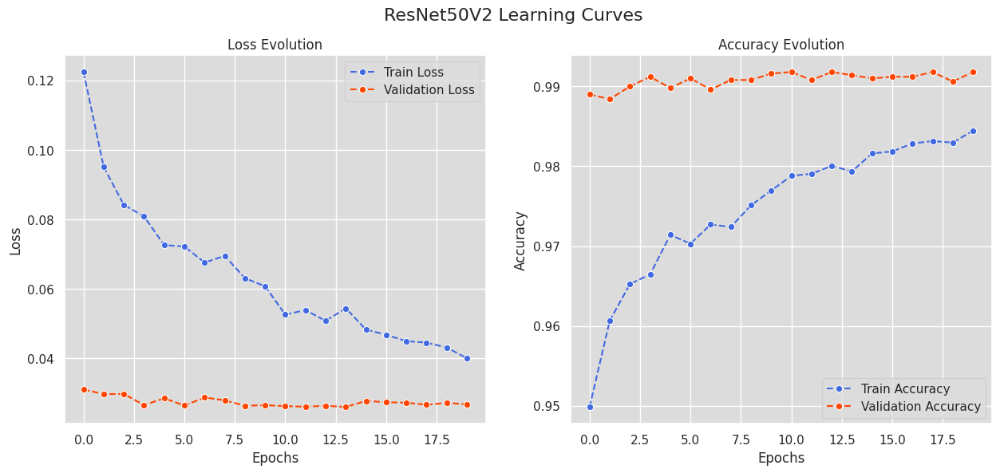

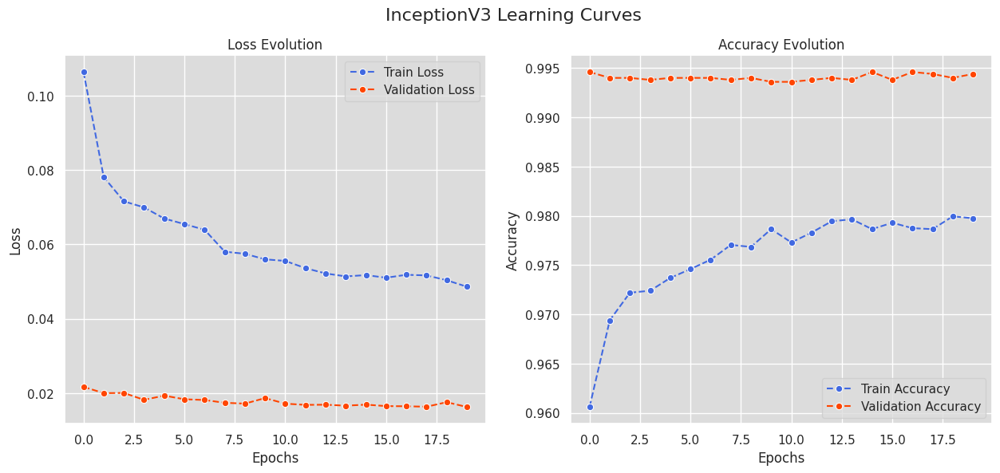

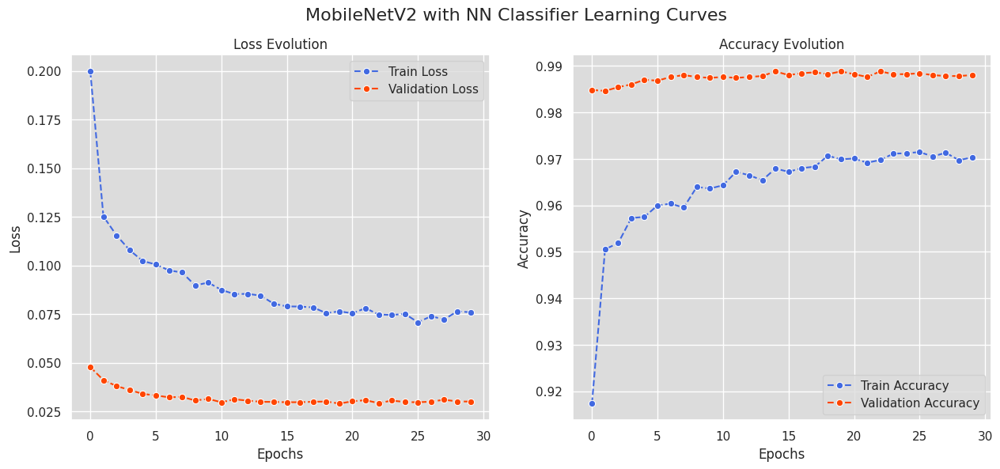

In [45]:
plot_learning_curves(resnet50v2_history, title='ResNet50V2 Learning Curves')
plot_learning_curves(inceptionv3_history, title='InceptionV3 Learning Curves')
plot_learning_curves(mobilenetv2_nn_history, title='MobileNetV2 with NN Classifier Learning Curves')

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
<h2 align="left"><font color='#33312b'>🧠 Insights from Model Training on the Cat/Dog Dataset</font></h2>

All of our deep learning models demonstrate a smooth and consistent decrease in training loss, indicating effective learning progression. The validation loss also decreases steadily, closely mirroring the training loss, which suggests that the models are generalizing well and not overfitting. Regarding accuracy, both training and validation metrics improve with each epoch and plateau at high levels, signaling that the models have confidently learned the task. Overall, all models have successfully trained and achieved high validation accuracies, indicating effective performance in this classification task.

<a id="Accuracy_Assessment"></a>
# <b><span style='color:gray'>Step 6.2 |</span><span style='color:#33312b'> Accuracy Assessment</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
To assess the accuracy of the **ResNet50V2**, **InceptionV3**, and **MobileNetV2** (with a neural network classifier) models, I am going to define a function first:

In [46]:
def calculate_accuracy(model, val_generator):
    # Evaluates the model on the validation set
    results = model.evaluate(val_generator, steps=len(val_generator))
    # The 'results' list contains loss as the first element and accuracy as the second
    accuracy = results[1]
    return accuracy

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

The, I am going to call this function for each of the neural network models to get their accuracies:

In [47]:
resnet50v2_accuracy = calculate_accuracy(resnet50v2_model, resnet50v2_val_generator)
inceptionv3_accuracy = calculate_accuracy(inceptionv3_model, inceptionv3_val_generator)
mobilenetv2_nn_accuracy = calculate_accuracy(mobilenetv2_nn_model, mobilenetv2_nn_val_generator)

157/157 [==============================] - 10s 63ms/step - loss: 0.0290 - accuracy: 0.9888


<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

Now that I have gathered all the model accuracies, including the SVM classifier's accuracy from `step 5.4.4`, I am ready to proceed with comparing these accuracies on a horizontal bar plot for a visual and straightforward comparison:

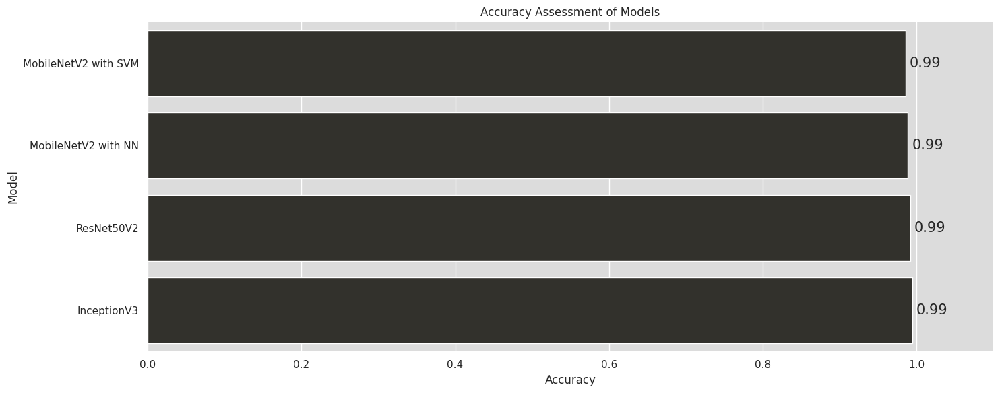

In [48]:
# A dictionary to hold our model names and their corresponding accuracies
accuracies = {
    'MobileNetV2 with SVM': svm_validation_accuracy,
    'ResNet50V2': resnet50v2_accuracy,
    'InceptionV3': inceptionv3_accuracy,
    'MobileNetV2 with NN': mobilenetv2_nn_accuracy
}

# Convert the dictionary into a pandas DataFrame for easy plotting
accuracy_df = pd.DataFrame(list(accuracies.items()), columns=['Model', 'Accuracy'])

# Sort the DataFrame by the 'Accuracy' column to ensure the plot is ordered
accuracy_df.sort_values('Accuracy', ascending=True, inplace=True)

# Create a horizontal bar plot
plt.figure(figsize=(15, 6))
bar_plot = sns.barplot(x='Accuracy', y='Model', data=accuracy_df, color='#33312b', orient='h')

# Add the accuracy values on the bars
for p in bar_plot.patches:
    bar_plot.annotate(format(p.get_width(), '.2f'), 
                      (p.get_width()+0.02, p.get_y() + p.get_height() / 2),
                      ha='center', va='center',
                      xytext=(5, 0), textcoords='offset points', fontsize=15)

plt.xlabel('Accuracy')
plt.title('Accuracy Assessment of Models')
plt.xlim(0, 1.1)  
plt.tight_layout()
plt.show()

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
<h2 align="left"><font color='#33312b'>🔍 Accuracy Assessment Across Models</font></h2>

The plot provides an accuracy comparison across our models. **InceptionV3** stands out with top performance, while **ResNet50V2** and **MobileNetV2** using a Neural Network approach exhibit closely trailing high accuracy. The MobileNetV2 with a Support Vector Machine (SVM) shows a slightly reduced accuracy. Enhancements to the SVM variant could include SVM hyperparameter optimization. With high accuracies being almost universal, additional factors such as model size and inference time become pivotal in model selection.

<a id="Inference_Time"></a>
# <b><span style='color:gray'>Step 6.3 |</span><span style='color:#33312b'> Inference Time Comparison</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

Due to the uncertainty of the end-user environment for our desktop app deployment and the potential variability in whether the end-user system will have GPU capabilities, we are unable to conduct a fair inference time comparison at this moment. Our current setup on Kaggle uses a **P100 GPU**, which would give an advantage to neural network models in terms of speed and not accurately reflect their performance on systems without GPU acceleration. As such, to avoid drawing misleading conclusions, we will not be comparing inference times until we can test on a CPU-only environment that more closely resembles our potential deployment scenarios.

<a id="Model_Size"></a>
# <b><span style='color:gray'>Step 6.4 |</span><span style='color:#33312b'> Model Size and Deployment Considerations</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">

To evaluate the storage footprint of our models, which is typically indicative of their complexity and parameter count, we can save each model to a file and examine the respective file sizes. Given that ResNet50V2 and InceptionV3 are substantially larger in size compared to MobileNetV2 models, we will focus our comparison on the MobileNetV2 variants:

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
Saving **MobileNetV2** model with **SVM classifier** Components:

In [49]:
# Save the MobileNetV2 feature extractor, which is used to extract features from images before passing them to the SVM
mobilenetv2_feature_extractor.save('mobilenetv2_feature_extractor.h5')

# Save the PCA transformer, which is used to reduce the dimensionality of the features from the MobileNetV2 feature extractor
dump(pca, 'pca_transformer.joblib')

# Save the SVM classifier, which is the final classification model
dump(svm_model, 'svm_classifier.joblib')

['svm_classifier.joblib']

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
Saving **MobileNetV2 model with Neural Network classifier**, which includes both the feature extraction and classification layers in one package:

In [50]:
# Save the entire MobileNetV2 neural network model
mobilenetv2_nn_model.save('mobilenetv2_nn_model.h5')

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
Now, I am going to retrieve their sizes:

In [51]:
# Function to get file size in MB
def get_file_size(file_path):
    return os.path.getsize(file_path) / (1024 * 1024)  # Convert bytes to MB

In [52]:
# Get the file sizes using the above function
size_feature_extractor = get_file_size('mobilenetv2_feature_extractor.h5')
size_pca = get_file_size('pca_transformer.joblib')
size_svm = get_file_size('svm_classifier.joblib')
size_mobilenetv2_nn = get_file_size('mobilenetv2_nn_model.h5')

# Sum the sizes for the SVM-based model
total_size_svm = size_feature_extractor + size_pca + size_svm

# Create a dictionary with the total model sizes
total_model_sizes = {
    'MobileNetV2_SVM_Total': total_size_svm,
    'MobileNetV2_NN': size_mobilenetv2_nn
}

# Prepare the data for plotting
total_model_size_df = pd.DataFrame(list(total_model_sizes.items()), columns=['Model', 'Size'])

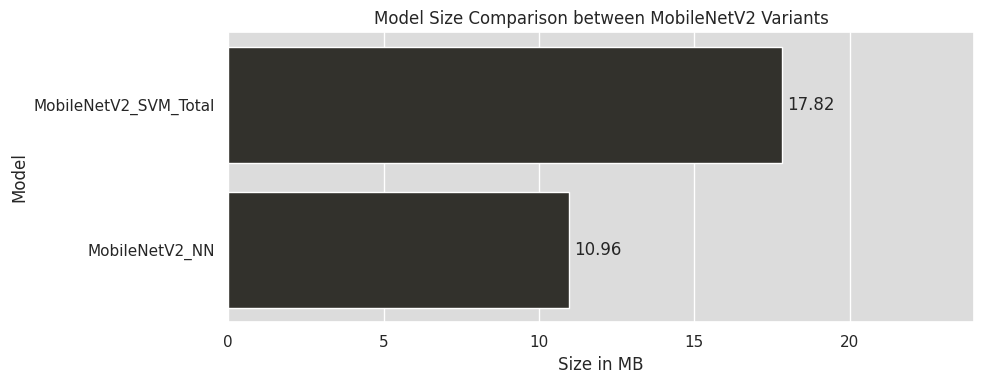

In [53]:
# Plot
plt.figure(figsize=(10, 4))
bar_plot = sns.barplot(x='Size', y='Model', data=total_model_size_df, color='#33312b', orient='h')

# Add the size values on the bars
for p in bar_plot.patches:
    bar_plot.annotate(format(p.get_width(), '.2f'), 
                      (p.get_width()+0.7, p.get_y() + p.get_height() / 2), 
                      ha='center', va='center', 
                      xytext=(5, 0), textcoords='offset points')

plt.xlabel('Size in MB')
plt.title('Model Size Comparison between MobileNetV2 Variants')
plt.xlim(0, 24)  
plt.tight_layout()
plt.show()

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
<h2 align="left"><font color='#33312b'>📉 Model Size Comparison of MobileNetV2 Variants</font></h2>

The horizontal bar plot demonstrates that the **MobileNetV2 with an SVM classifier** has a larger total model size compared to its **NN counterpart**. This total size for of the SVM variant encompasses the MobileNetV2 feature extractor, the SVM classifier, and the PCA transformer for dimensionality reduction. Understanding that InceptionV3 and ResNet50V2 are not included due to their much larger sizes, the choice between these MobileNetV2 models may be influenced by deployment constraints where model size is a critical factor.


<a id="Model_Selection"></a>
# <p style="background-color: #33312b; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;"> Step 7 | Final Model Selection and Justification</p>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:130%; text-align:left">
<h2 align="left"><font color='#33312b'> 🏆 Final Model Selection and Rationale</font></h2>

Given the near-perfect accuracy across all models and our deployment considerations, the model size has become the decisive factor. Our choice is the **MobileNetV2 with NN classifier**. This model not only offers high accuracy but also benefits from the smallest size among the competitors. This advantage is likely to translate into faster inference speeds, which is particularly beneficial for our desktop application deployment. Thus, the **MobileNetV2 with NN classifier** stands out as the optimal choice for our requirements.

<div style="border-radius:10px; padding: 15px; background-color:gainsboro; font-size:125%; text-align:left">
    
Finally, let's download our trained model for deployment:

In [54]:
def download_all_models(files, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    
    # Create a command to zip all files
    command = f"zip {zip_name} " + " ".join(files)
    
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode != 0:
        print("Unable to run zip command!")
        print(result.stderr)
        return
    
    display(FileLink(f'{download_file_name}.zip'))

In [55]:
# List of model files to download
model_files = ['mobilenetv2_nn_model.h5']

# Call the function with the list of files (Uncomment the following line, if you want to save your model)
# download_all_models(model_files, 'models_archive')

<div style="display: flex; align-items: center; justify-content: center; border-radius: 10px; padding: 20px; background-color:  gainsboro; font-size: 120%; text-align: center;">


<strong>🎯 For more details and to explore the App code, kindly check out the project's <a href="https://github.com/FarzadNekouee/WeatherProof_PetDetection_App/tree/master">GitHub repository</a> 🎯</strong>
</div>   

<h2 align="left"><font color=#33312b>Best Regards</font></h2>